In [1]:
# Selecting libraries
import yfinance as yf
import pandas as pd
import numpy as np
import pyfolio as py
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings("ignore")

import cvxopt as opt
from cvxopt import blas, solvers
pd.set_option('display.max_columns', 500)

from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

/opt/homebrew/Caskroom/miniforge/base/envs/thesis_2/lib/python3.10/site-packages/pyfolio/pos.py:26: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  warnings.warn(


In [106]:
# Define the assets and key initial metrics as investment amount to generate a portfolio

stocks = ['AAPL', 'MSFT', 'NVDA', 'JNJ', 'NVS','JPM','GS','AMZN','DIS','MCD','NEE','BA','CAT','XOM','CVX','RIO','BHP']
portfolio_value = 10**6                         # Initial Portfolio Value to be allocated in full
weights = [1/len(stocks)]*len(stocks)         # Weight Allocation per asset

benchmark = '^GSPC'                    # Which is your benchmark? ^GSPC is SP500 for Yfinance library

start_date = '2009-01-01'              # Start date for asset data download
live_date = '2015-01-01'               # Portfolio LIVE start date (for analytics)


# Warning handling
if len(weights) != len(stocks):
    print(sum((np.array(weights))))
    print('Number of Asset does not match weight allocated')
    
weight = round(sum((np.array(weights))))
if weight != 1.0:
    print(sum((np.array(weights))))
    print('Weight could not be allocated properly, make sure they sum 1.0')


In [107]:
# Download data, clean and isolate values for calculation
# If you use other data source, make sure the format is the same than stock_data.head() on next cell. Check dtypes by stock_data.info()

stock_data = yf.download(stocks, start=start_date)['Adj Close']
stock_data = stock_data.dropna()
stock_data = stock_data.reindex(columns=stocks)
stock_prices = stock_data[stocks].values

[*********************100%***********************]  17 of 17 completed


In [108]:
shares_df = pd.DataFrame(index=[stock_data.index[0]])

for s,w in zip(stocks, weights):
    shares_df[s + '_shares'] = np.floor((portfolio_value * np.array(w)) / stock_data[s][0])

shares_df    

,AAPL_shares,MSFT_shares,NVDA_shares,JNJ_shares,NVS_shares,JPM_shares,GS_shares,AMZN_shares,DIS_shares,MCD_shares,NEE_shares,BA_shares,CAT_shares,XOM_shares,CVX_shares,RIO_shares,BHP_shares
2009-01-02,21353.0,3888.0,29443.0,1485.0,2329.0,2688.0,855.0,21642.0,2855.0,1395.0,6984.0,1733.0,1872.0,1233.0,1359.0,6346.0,2555.0


### Process the MTL GARCH files.

In [109]:
# std_data.index = pd.to_datetime(std_data.index)
# std_data = std_data * np.sqrt(21)
# std_data

vol_data = pd.read_csv('./notebooks/test_vol.csv',index_col=0) #

# month_vol = vol_data *np.sqrt(21)
# month_var = month_vol**2
# std_data = month_var.copy()
std_data = vol_data.copy()
std_data.index = pd.to_datetime(std_data.index)
std_data 
# convert to monthly volatilty

,AAPL,MSFT,NVDA,JNJ,NVS,JPM,GS,AMZN,DIS,MCD,NEE,BA,CAT,XOM,CVX,RIO,BHP
Date,,,,,,,,,,,,,,,,,
2009-02-08,0.721723,0.818089,1.462633,0.395512,0.516632,1.948434,1.180200,1.014781,0.784249,0.448820,0.596133,1.013027,1.194089,0.617253,0.705557,1.755550,1.130694
2009-02-15,0.800277,0.756112,1.424457,0.386939,0.497923,1.821259,1.247614,1.015741,0.751184,0.402952,0.533393,0.991368,1.158939,0.586355,0.661857,1.743420,1.130840
2009-02-22,0.789265,0.903222,1.394273,0.379074,0.500720,1.590158,1.117247,0.989905,0.725258,0.396913,0.545094,0.944989,1.174691,0.557170,0.621621,1.689012,1.119671
2009-03-01,0.730268,0.831123,1.360457,0.373582,0.546323,1.388143,1.070177,1.082140,0.679356,0.373350,0.652686,0.899080,1.273301,0.540053,0.580762,1.632906,1.086366
2009-03-08,0.805162,0.986085,1.517000,0.354985,0.523159,1.285763,1.370726,1.123430,0.694543,0.361544,0.580062,0.862103,1.217686,0.578771,0.645352,2.084422,1.274090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-01,0.667170,0.635713,1.160935,0.335674,0.400336,0.616628,0.632974,0.988949,0.663533,0.354889,0.504040,0.959438,0.748667,0.741053,0.615190,0.866445,0.847604
2023-01-08,0.665971,0.626790,1.133667,0.335967,0.394225,0.613662,0.670191,0.979796,0.684531,0.353236,0.465607,0.918960,0.733583,0.756931,0.719683,0.853072,0.825430
2023-01-15,0.688265,0.592801,1.112416,0.326186,0.388962,0.610813,0.659149,0.954521,0.665617,0.365397,0.433419,0.882806,0.697857,0.717173,0.666820,0.846313,0.819580


Each time you move the window forward one step, you should recalculate the volatility forecast for the next period and use it in your covariance matrix for the optimal portfolio weight calculation for that step.

The idea here is that you're trying to predict the optimal portfolio weights for the next period, based on the data you have up to and including the current period. Your GARCH model fits into this by giving you a forecasted volatility for the next period, which you then use in your weight optimization.

In [110]:
end_date = std_data.index[-1]
stock_data = stock_data.loc[:end_date]

In [111]:
window_length = 252 
df = stock_data.copy()
start_date = df.index[window_length]
stock_data = stock_data.loc[start_date:]
shares_df = shares_df.loc[start_date:]


In [112]:
stock_data

,AAPL,MSFT,NVDA,JNJ,NVS,JPM,GS,AMZN,DIS,MCD,NEE,BA,CAT,XOM,CVX,RIO,BHP
Date,,,,,,,,,,,,,,,,,
2010-01-04,6.496294,23.572371,4.241150,43.633125,28.004408,30.073082,138.805923,6.695000,27.933916,42.994102,8.992380,43.777546,40.934708,41.319057,46.397530,25.387173,41.646702
2010-01-05,6.507524,23.579990,4.303083,43.127178,27.977793,30.655594,141.259918,6.734500,27.864239,42.665390,8.904567,45.211349,41.424114,41.480385,46.726181,25.783655,41.651924
2010-01-06,6.404016,23.435276,4.330606,43.477962,27.876652,30.824020,139.752274,6.612500,27.716160,42.083271,8.992380,46.582809,41.549965,41.838909,46.732044,26.569822,42.337570
2010-01-07,6.392176,23.191557,4.245738,43.167648,27.631794,31.434614,142.487000,6.500000,27.724873,42.391445,8.967044,48.468552,41.717754,41.707458,46.555988,26.574348,41.965958
2010-01-08,6.434673,23.351505,4.254914,43.316055,27.855366,31.357420,139.792419,6.676000,27.768425,42.350361,8.889369,48.001019,42.186180,41.540142,46.638153,26.870010,42.541695
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-23,140.700256,241.446106,191.877533,165.856689,88.369484,135.272095,344.038269,97.519997,105.690002,266.330383,81.615631,209.970001,251.335724,110.936310,177.340317,76.284309,69.379997
2023-01-24,142.116135,240.908630,192.597351,165.856689,88.187393,136.434921,343.240051,96.320000,106.000000,266.597412,82.829948,211.979996,256.219208,111.969322,177.507187,76.507080,69.760002
2023-01-25,141.448074,239.485321,193.177200,167.039200,88.944496,137.095154,344.521088,97.180000,108.120003,269.999603,75.613174,212.679993,257.044739,111.379036,175.789352,77.369102,70.760002


In [122]:
# Set the number of assets, assumed that 'df' is your DataFrame with historical prices.
df = stock_data.copy()
volatility_df = std_data.copy()
num_assets = len(df.columns)
stocks = df.columns
window_length = 31 #months

vol_data_ind = volatility_df.resample('M').last().index
volatility_df_month = volatility_df.resample('M').last()


# Cred portfolio weights over time
optimal_weights_df = pd.DataFrame(index=df.index, columns=stocks)

# Loop over each end-of-month date
for end_date in vol_data_ind[window_length:]:
    
    # Extract the window of data
    data_window = df.loc[:end_date].tail(window_length*20)
    
    #Check if we at the end of the month, if this end date is within 2 days of :

    # Calculate expected returns and covariance matrix for the window, these are mean daily returns
    mu = expected_returns.mean_historical_return(data_window)
    
    # Get the dates that are greater than end_date
    future_dates = vol_data_ind[vol_data_ind > end_date]

    # Check if there are any future dates
    if len(future_dates) > 0:
        # Get the first future date
        next_month = future_dates[0]
    else:
        # If there are no future dates, break the loop
        break
    
    next_month = vol_data_ind[vol_data_ind > end_date][0]
    # Get the volatility data for the closest week
    volatility_df_pred = volatility_df_month[volatility_df_month.index == next_month]

    # replace diagonal elements of cov matrix by GARCH-predicted variance.
    S =  risk_models.sample_cov(data_window)  # annualised daily frequency =252
    S_adj =  S.copy()
    for symbols in stocks:
        S_adj[symbols][symbols] = volatility_df_pred[symbols][0]**(2) #Volatility = Variance^1/2 = Standard Deviation
    
    # Initialise and optimize the portfolio on the window of data
    ef = EfficientFrontier(mu, S_adj, weight_bounds=(0, 1))  # Set bounds to allow shorting
    raw_weights = ef.max_sharpe()  # Optimize for maximal Sharpe ratio
    cleaned_weights = ef.clean_weights()  # Clean the raw weights
    
    # Add the weights to our optimal_weights dataframe
    optimal_weights_df.loc[end_date] = [cleaned_weights.get(stock) for stock in stocks]

# Forward fill the weights for the days we aren't rebalancing
optimal_weights_df = optimal_weights_df.fillna(method='ffill')

# Print out the final DataFrame
optimal_weights_df.sort_index()


,AAPL,MSFT,NVDA,JNJ,NVS,JPM,GS,AMZN,DIS,MCD,NEE,BA,CAT,XOM,CVX,RIO,BHP
Date,,,,,,,,,,,,,,,,,
2010-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-23,0.06613,0.00493,0.02043,0.11989,0.0,0.01287,0.10214,0.0,0.0,0.22746,0.06198,0.0,0.06275,0.15605,0.14306,0.0131,0.00919
2023-01-24,0.06613,0.00493,0.02043,0.11989,0.0,0.01287,0.10214,0.0,0.0,0.22746,0.06198,0.0,0.06275,0.15605,0.14306,0.0131,0.00919
2023-01-25,0.06613,0.00493,0.02043,0.11989,0.0,0.01287,0.10214,0.0,0.0,0.22746,0.06198,0.0,0.06275,0.15605,0.14306,0.0131,0.00919


In [123]:
optimal_weights_df.sort_index()

,AAPL,MSFT,NVDA,JNJ,NVS,JPM,GS,AMZN,DIS,MCD,NEE,BA,CAT,XOM,CVX,RIO,BHP
Date,,,,,,,,,,,,,,,,,
2010-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-23,0.06613,0.00493,0.02043,0.11989,0.0,0.01287,0.10214,0.0,0.0,0.22746,0.06198,0.0,0.06275,0.15605,0.14306,0.0131,0.00919
2023-01-24,0.06613,0.00493,0.02043,0.11989,0.0,0.01287,0.10214,0.0,0.0,0.22746,0.06198,0.0,0.06275,0.15605,0.14306,0.0131,0.00919
2023-01-25,0.06613,0.00493,0.02043,0.11989,0.0,0.01287,0.10214,0.0,0.0,0.22746,0.06198,0.0,0.06275,0.15605,0.14306,0.0131,0.00919


In [124]:
optimal_weights_df = optimal_weights_df.dropna()

start_date = optimal_weights_df.index[0]
stock_data = stock_data.loc[start_date:]
shares_df = shares_df.loc[start_date:]



In [125]:
shares_df = pd.DataFrame(index=[stock_data.index[0]])

for s,w in zip(stocks, weights):
    shares_df[s + '_shares'] = np.floor((portfolio_value * np.array(w)) / stock_data[s][0])

shares_df    

,AAPL_shares,MSFT_shares,NVDA_shares,JNJ_shares,NVS_shares,JPM_shares,GS_shares,AMZN_shares,DIS_shares,MCD_shares,NEE_shares,BA_shares,CAT_shares,XOM_shares,CVX_shares,RIO_shares,BHP_shares
2011-09-30,5081.0,2983.0,20499.0,1287.0,1832.0,2737.0,762.0,5440.0,2214.0,926.0,6014.0,1195.0,1096.0,1296.0,1019.0,2843.0,1612.0


In [126]:
# initialize variables
balance_year = stock_data.index[0].year
balance_month = stock_data.index[0].month
signal = False
count = 0    # for loop count purpose

# Store previous values in a dictionary
prev_values = {}

# Calculate portfolio value for the first day
portfolio_value = sum([shares_df.loc[stock_data.index[0], s + '_shares'] * stock_data.loc[stock_data.index[0], s] for s in stocks])

for day in stock_data.index:
    count += 1
    if day == stock_data.index[0]:
        shares_df.loc[day] = shares_df.loc[day] # First day

        # Store initial values as previous values
        for col in shares_df.columns:
            prev_values[col] = shares_df.loc[day, col]


    elif day.month != balance_month or day.year != balance_year:
        signal = True

        # get the weights for the current period
        weights = optimal_weights_df.loc[day]
        # Print to debug


        # calculate new shares based on the new portfolio value and weights
        new_shares = [np.floor((portfolio_value * w) / stock_data[s][day]) for s,w in zip(stocks, weights)]
        shares_df.loc[day, :] = new_shares
        # Print to debug

        balance_month = day.month
        count += 1

        # Store new values as previous values
        for col in shares_df.columns:
            prev_values[col] = shares_df.loc[day, col]
            
        balance_year = day.year
        balance_month = day.month

    else:

        signal = False

        # Use previous values if it is not a rebalancing date
        shares_df.loc[day, :] = [prev_values[col] for col in shares_df.columns]

    # Calculate asset values and portfolio value for the current day
    asset_values = [shares_df.loc[day, s + '_shares'] * stock_data.loc[day, s] for s in stocks]
    portfolio_value = sum(asset_values)
    
    stock_data.loc[day, 'Signal'] = signal
    stock_data.loc[day, 'Portfolio_Value'] = portfolio_value
    
    # Add shares to stock data frame
    for s in stocks:
        stock_data.loc[day, s + '_shares'] = shares_df.loc[day, s + '_shares']
        stock_data.loc[day, s + '_value'] = shares_df.loc[day, s + '_shares'] * stock_data.loc[day, s]


In [127]:
# Calculate log returns for portfolio
stock_data['Portfolio_Value_rets'] = np.log(stock_data['Portfolio_Value'] / stock_data['Portfolio_Value'].shift(1))

# Calculate log returns for each stock
for stock in stocks:
    stock_data[f'{stock}_rets'] = np.log(stock_data[stock] / stock_data[stock].shift(1))

In [128]:
start_date_benchmark = stock_data.index[0]
stock_data = stock_data.dropna()

In [129]:
# Calculate daily weight per asset
for s in stocks:
    stock_data[s + '_weight'] = stock_data[s + '_value'] / stock_data['Portfolio_Value']

In [130]:
stock_data.filter(regex='weight')

,AAPL_weight,MSFT_weight,NVDA_weight,JNJ_weight,NVS_weight,JPM_weight,GS_weight,AMZN_weight,DIS_weight,MCD_weight,NEE_weight,BA_weight,CAT_weight,XOM_weight,CVX_weight,RIO_weight,BHP_weight
Date,,,,,,,,,,,,,,,,,
2011-10-03,0.265114,0.000000,0.000000,0.000000,0.016033,0.000000,0.000000,0.105123,0.0,0.565420,0.000000,0.0,0.019738,0.000000,0.028572,0.000000,0.000000
2011-10-04,0.262816,0.000000,0.000000,0.000000,0.016212,0.000000,0.000000,0.105057,0.0,0.566692,0.000000,0.0,0.020232,0.000000,0.028991,0.000000,0.000000
2011-10-05,0.265641,0.000000,0.000000,0.000000,0.016029,0.000000,0.000000,0.108016,0.0,0.559837,0.000000,0.0,0.020616,0.000000,0.029860,0.000000,0.000000
2011-10-06,0.262455,0.000000,0.000000,0.000000,0.016168,0.000000,0.000000,0.107949,0.0,0.562679,0.000000,0.0,0.021195,0.000000,0.029555,0.000000,0.000000
2011-10-07,0.258120,0.000000,0.000000,0.000000,0.016229,0.000000,0.000000,0.109919,0.0,0.565298,0.000000,0.0,0.020838,0.000000,0.029596,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-23,0.072116,0.004807,0.026462,0.109461,0.000000,0.012714,0.099526,0.000000,0.0,0.224002,0.059086,0.0,0.064466,0.159699,0.143600,0.014027,0.010035
2023-01-24,0.072496,0.004774,0.026435,0.108942,0.000000,0.012763,0.098824,0.000000,0.0,0.223163,0.059680,0.0,0.065407,0.160421,0.143053,0.014001,0.010042
2023-01-25,0.072383,0.004761,0.026598,0.110065,0.000000,0.012865,0.099506,0.000000,0.0,0.226726,0.054653,0.0,0.065825,0.160080,0.142116,0.014204,0.010219


In [131]:
fig = go.Figure()

# Loop through each stock and add a trace for its shares
for stock in stocks:
    fig.add_trace(go.Scatter(x=stock_data.index, y=shares_df[stock+'_shares'], mode='lines', name=stock+'_shares'))

fig.update_layout(title='Shares per day',
                  xaxis_title='Date',
                  yaxis_title='Shares',
                  width=800,
                  height=400)

fig.show()

In [132]:
fig = go.Figure()

# Loop through each stock and add a trace for its shares
for stock in stocks:
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data[stock + '_weight'], mode='lines', name=stock + '_weight'))

fig.update_layout(title='Weights per day',
                  xaxis_title='Date',
                  yaxis_title='Weights',
                  width=1000,
                  height=600)

fig.show()

In [133]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create subplot layout
fig = make_subplots(rows=2, cols=2, subplot_titles=('Portfolio Returns', 'Asset Returns', 'Shares Holding per Asset', 'Weights per Asset'))

# Add traces to the subplots
fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data['Portfolio_Value_rets'].cumsum(), name='Portfolio'), row=1, col=1)

for s in stocks:
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data[f'{s}_rets'].cumsum(), name=f'{s}'), row=1, col=2)
    fig.add_trace(go.Scatter(x=shares_df.index, y=shares_df[f'{s}_shares'], name=f'{s}'), row=2, col=1)
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data[f'{s}_weight'], name=f'{s}'), row=2, col=2)

# Update subplot layout
fig.update_layout(height=800, width=1200, title='Strategy Overview', showlegend=False)

# Display the plot
fig.show()


In [134]:
# Benchmark data download and returns
start_date_benchmark = stock_data.index[0]
benchmark_data = yf.download(benchmark, start=start_date_benchmark)
benchmark_data = benchmark_data.dropna()
benchmark_data['benchmark_rets'] = np.log(benchmark_data['Adj Close'] / benchmark_data['Adj Close'].shift(1))
benchmark_data['benchmark_rets'] = benchmark_data['benchmark_rets'].dropna()

[*********************100%***********************]  1 of 1 completed


In [135]:
# Data timezone unification for pyfolio valuation
if stock_data.index.tz is None:
    stock_data.index = stock_data.index.tz_localize('UTC')
else:
    stock_data.index = stock_data.index.tz_convert('UTC')

if benchmark_data.index.tz is None:
    benchmark_data.index = benchmark_data.index.tz_localize('UTC')
else:
    benchmark_data.index = benchmark_data.index.tz_convert('UTC')

# Convert live_date to a datetime object, then localize or convert as needed.
live_date = pd.to_datetime(live_date)
if live_date.tzinfo is None:
    live_date = live_date.tz_localize('UTC')
else:
    live_date = live_date.tz_convert('UTC')



Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,37.22,2021-12-07,2022-10-03,NaT,NaN
1,35.82,2020-02-18,2020-03-23,2020-06-08,80
2,26.72,2018-10-03,2018-12-24,2019-11-18,294
3,18.02,2021-01-25,2021-03-08,2021-08-20,150
4,15.32,2015-11-20,2016-02-11,2016-07-06,164


AttributeError: 'Axes' object has no attribute 'is_last_row'

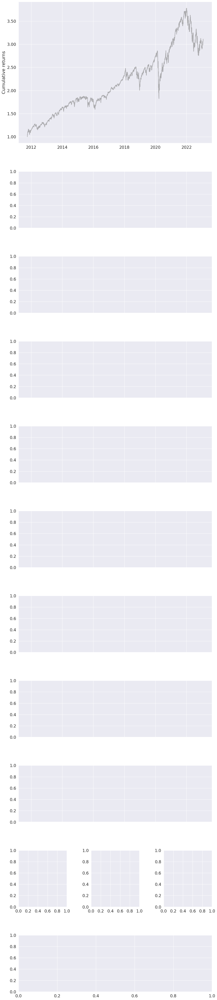

In [136]:
py.create_full_tear_sheet(stock_data['Portfolio_Value_rets'], benchmark_rets = benchmark_data['benchmark_rets'], live_start_date = live_date)